## Create an Asynchronous endpoint

### SageMaker setup

In [112]:
import boto3

# Specify your AWS Region
aws_region='ap-south-1'

role = get_execution_role()

# Create a low-level SageMaker service client.
sagemaker_client = boto3.client('sagemaker', region_name=aws_region)

# Role to give SageMaker permission to access AWS services.
sagemaker_role= get_execution_role()

sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/ec2-user/.config/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/ec2-user/.config/sagemaker/config.yaml


### Locate the model

In [113]:
import boto3

In [114]:
#Create a variable w/ the model S3 URI
s3_bucket = 'rns-conclave-2023' # Provide the name of your S3 bucket
bucket_prefix=''
model_s3_key = f"model.tar.gz"

#Specify S3 bucket w/ model
model_url = f"s3://{s3_bucket}/{model_s3_key}"

### Identify the container

In [115]:
from sagemaker import image_uris

# Specify an AWS container image. 
container = "684473352813.dkr.ecr.ap-south-1.amazonaws.com/new-pytorch-inference-container-extension-aging-gpu-v2:latest"

### Create a model

In [116]:
model_name = 'conclave-time-traveler-model-5'

#Create model
create_model_response = sagemaker_client.create_model(
    ModelName = model_name,
    ExecutionRoleArn = sagemaker_role,
    PrimaryContainer = {
        'Image': container,
        'ModelDataUrl': model_url,
        'Environment':{
            'TS_MAX_REQUEST_SIZE': '100000000',
            'TS_MAX_RESPONSE_SIZE': '100000000',
            'TS_DEFAULT_RESPONSE_TIMEOUT': '1000'
        },
    })

### Create endpoint configuration

In [117]:
import datetime
from time import gmtime, strftime

# Create an endpoint config name. Here we create one based on the date  
# so it we can search endpoints based on creation time.
endpoint_config_name = f"ConclaveTimeTravelerEndpointConfig-{strftime('%Y-%m-%d-%H-%M-%S', gmtime())}"

# The name of the model that you want to host. This is the name that you specified when creating the model.
#model_name='<The_name_of_your_model>'
# This has been already set in the earlier cell

create_endpoint_config_response = sagemaker_client.create_endpoint_config(
    EndpointConfigName=endpoint_config_name, # You will specify this name in a CreateEndpoint request.
    # List of ProductionVariant objects, one for each model that you want to host at this endpoint.
    ProductionVariants=[
        {
            "VariantName": "variant1", # The name of the production variant.
            "ModelName": model_name, 
            "InstanceType": "ml.g4dn.xlarge", # Specify the compute instance type.
            "InitialInstanceCount": 1 # Number of instances to launch initially.
        }
    ],
    AsyncInferenceConfig={
        "OutputConfig": {
            # Location to upload response outputs when no location is provided in the request.
            "S3OutputPath": f"s3://{s3_bucket}/output",
            # (Optional) specify Amazon SNS topics
#            "NotificationConfig": {
#                "SuccessTopic": "arn:aws:sns:ap-south-1:684473352813:Model_Success",
#                "ErrorTopic": "arn:aws:sns:ap-south-1:684473352813:Model_Failure",
#            }
        },
        "ClientConfig": {
            # (Optional) Specify the max number of inflight invocations per instance
            # If no value is provided, Amazon SageMaker will choose an optimal value for you
            "MaxConcurrentInvocationsPerInstance": 4
        }
    }
)

print(f"Created EndpointConfig: {create_endpoint_config_response['EndpointConfigArn']}")

Created EndpointConfig: arn:aws:sagemaker:ap-south-1:684473352813:endpoint-config/conclavetimetravelerendpointconfig-2023-11-21-14-34-40


### Create endpoint

In [118]:
# The name of the endpoint.The name must be unique within an AWS Region in your AWS account.
endpoint_name = "time-traveler-endpoint-9"

# The name of the endpoint configuration associated with this endpoint.
#endpoint_config_name='<endpoint-config-name>'
# This has already been set up in the previous cell

create_endpoint_response = sagemaker_client.create_endpoint(
                                            EndpointName=endpoint_name, 
                                            EndpointConfigName=endpoint_config_name) 


## Invoke the asynchronous endpoint

In [226]:
# Create a low-level client representing Amazon SageMaker Runtime
sagemaker_runtime = boto3.client("sagemaker-runtime", region_name="ap-south-1")

# Specify the location of the input. Here, a single JPEG file
input_location = "s3://rns-conclave-2023/input/Test-Picture-Of-Self.jpg"

# After you deploy a model into production using SageMaker hosting 
# services, your client applications use this API to get inferences 
# from the model hosted at the specified endpoint.
response = sagemaker_runtime.invoke_endpoint_async(
                            EndpointName=endpoint_name, 
                            ContentType='image/jpeg',
                            Accept='application/x-npy',
                            InputLocation=input_location,
                            InvocationTimeoutSeconds=900)

In [227]:
import json
from pprint import pprint

pprint(response)

{'InferenceId': 'c3739877-c976-4058-b212-8318538e6997',
 'OutputLocation': 's3://rns-conclave-2023-output/output/cb0c7412-488d-4aa8-b60b-34ac145b1064.out',
 'ResponseMetadata': {'HTTPHeaders': {'connection': 'keep-alive',
                                      'content-length': '54',
                                      'content-type': 'application/json',
                                      'date': 'Tue, 28 Nov 2023 06:49:10 GMT',
                                      'x-amzn-requestid': '5218f0f8-f593-40af-ba54-ca1545e80d2a',
                                      'x-amzn-sagemaker-outputlocation': 's3://rns-conclave-2023-output/output/cb0c7412-488d-4aa8-b60b-34ac145b1064.out'},
                      'HTTPStatusCode': 202,
                      'RequestId': '5218f0f8-f593-40af-ba54-ca1545e80d2a',
                      'RetryAttempts': 0}}


In [224]:
import botocore.exceptions

s3 = boto3.client('s3')
try:
    resp = s3.download_file('rns-conclave-2023','somefolder/somefile','localfile')
except Exception as e:
    pprint(e)


ClientError('An error occurred (404) when calling the HeadObject operation: Not Found')


### Check the results

#### Get the output file to local

In [228]:
!aws s3 cp s3://rns-conclave-2023-output/output/cb0c7412-488d-4aa8-b60b-34ac145b1064.out cb0c7412-488d-4aa8-b60b-34ac145b1064.out

download: s3://rns-conclave-2023-output/output/cb0c7412-488d-4aa8-b60b-34ac145b1064.out to ./cb0c7412-488d-4aa8-b60b-34ac145b1064.out


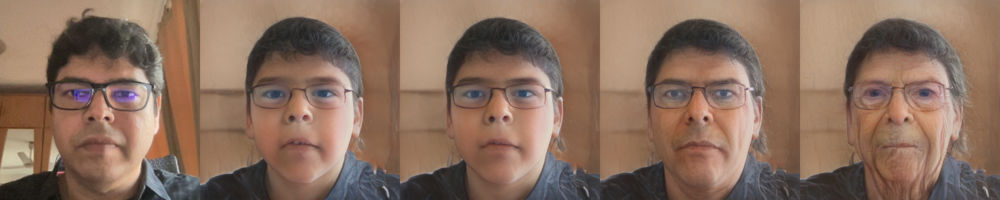

In [229]:
from PIL import Image
import numpy as np

results = np.load(f"./cb0c7412-488d-4aa8-b60b-34ac145b1064.out")

imgs = Image.fromarray(results)
imgs


In [150]:
results.shape

(1024, 5120, 3)

In [164]:
int(results.shape[1]/results.shape[0])

5

In [178]:
img = Image.fromarray(results[:,:1024,:])

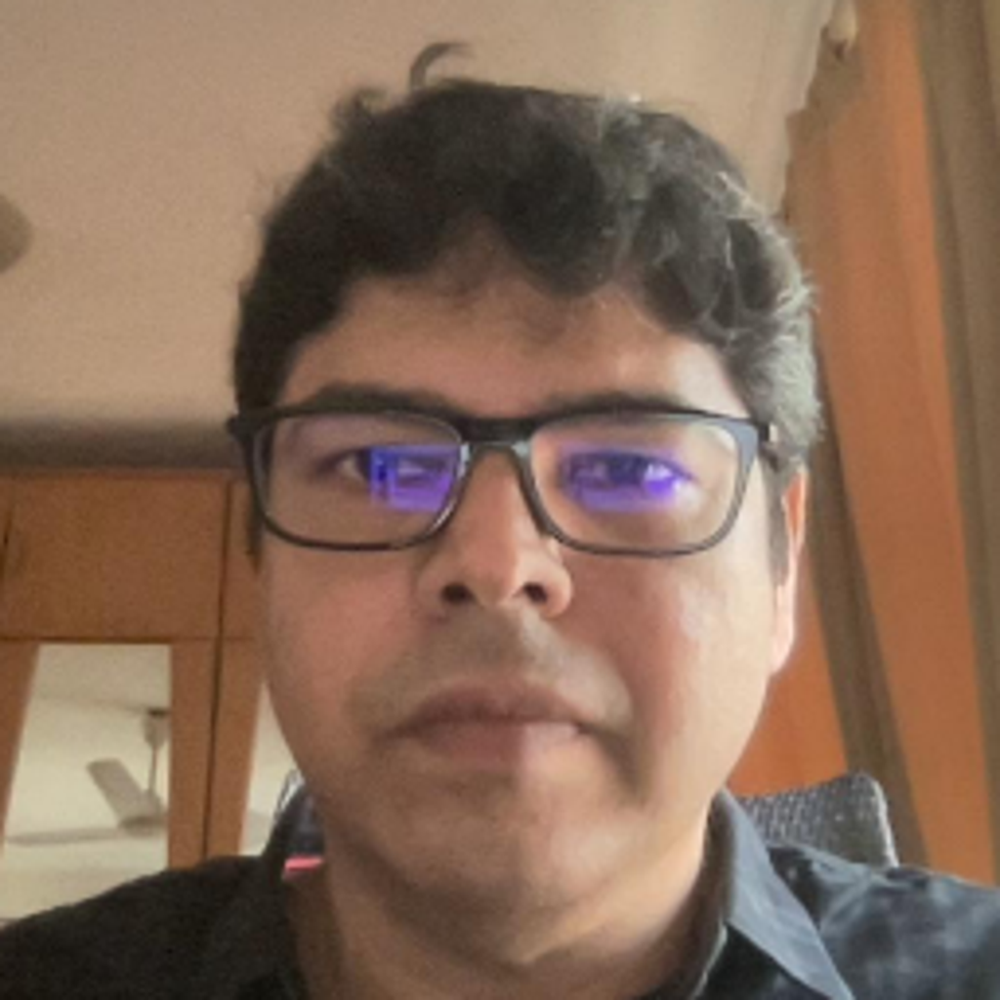

In [179]:
img.show()

#### Function to pick the right image from the array

In [173]:
### WIP ###

def showSpecificImage(image_number,images_array):
    '''image_numbers start from 0, 
    where image_number == 0 is the original, 
    photographed image'''
    if int(images_array.shape[1]/images_array.shape[0]) <= image_number:
        print("Invalid image id requested.")
        return
    if image_number == 0:
        starting_point = 0
        end_point = (starting_point + 1)*1024
    else:
        starting_point = image_number*1024
        end_point = starting_point+1024
    img = Image.fromarray(images_array[:,starting_point:end_point,:])
    img.show()

In [176]:
showSpecificImage(5,results)

Invalid image id requested.


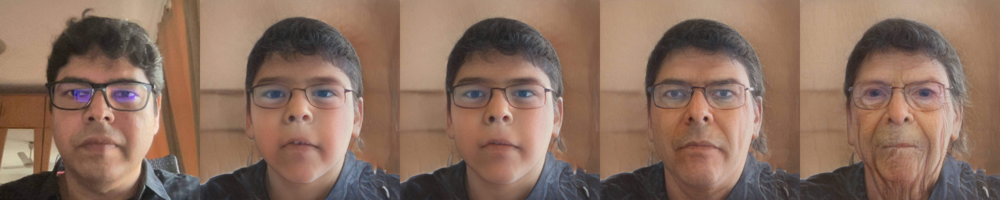

In [203]:
###***Working***###

import io
import numpy as np

s3 = boto3.resource('s3',region_name='ap-south-1')

Output_S3Location='s3://rns-conclave-2023/output/e87ddb53-836e-4ece-afe0-63fa87ddc3f6.out'
bucket = Output_S3Location.split('/')[2]
bucket = s3.Bucket(bucket)
ky = '/'.join(Output_S3Location.split('/')[3:])
objectfl = bucket.Object(ky)

response = objectfl.download_file('/tmp/temporary.npy')
results = np.load(f"/tmp/temporary.npy")
imgs = Image.fromarray(results)
imgs

### If you want to update the endpoint

In [225]:
s3_bucket_new = 'rns-conclave-2023-output'
model_name = 'conclave-time-traveler-model-5'
endpoint_name = 'time-traveler-endpoint-9'
endpoint_config_name = "rns-conclave-2023-Endpoint-Config-v1"

create_endpoint_config_response = sagemaker_client.create_endpoint_config(
    EndpointConfigName=endpoint_config_name, # You will specify this name in a CreateEndpoint request.
    # List of ProductionVariant objects, one for each model that you want to host at this endpoint.
    ProductionVariants=[
        {
            "VariantName": "variant1", # The name of the production variant.
            "ModelName": model_name, 
            "InstanceType": "ml.g4dn.xlarge", # Specify the compute instance type.
            "InitialInstanceCount": 1 # Number of instances to launch initially.
        }
    ],
    AsyncInferenceConfig={
        "OutputConfig": {
            # Location to upload response outputs when no location is provided in the request.
            "S3OutputPath": f"s3://{s3_bucket_new}/output",
        },
        "ClientConfig": {
            # (Optional) Specify the max number of inflight invocations per instance
            # If no value is provided, Amazon SageMaker will choose an optimal value for you
            "MaxConcurrentInvocationsPerInstance": 4
        }
    }
)

sagemaker_client.update_endpoint(
                                EndpointConfigName=endpoint_config_name,
                                EndpointName=endpoint_name
                                )

{'EndpointArn': 'arn:aws:sagemaker:ap-south-1:684473352813:endpoint/time-traveler-endpoint-9',
 'ResponseMetadata': {'RequestId': '235ac1f4-6ee1-476e-849e-47776f560ae7',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'x-amzn-requestid': '235ac1f4-6ee1-476e-849e-47776f560ae7',
   'content-type': 'application/x-amz-json-1.1',
   'content-length': '93',
   'date': 'Tue, 28 Nov 2023 06:42:01 GMT'},
  'RetryAttempts': 0}}

### Delete endpoint

In [111]:
sagemaker_client.delete_endpoint(EndpointName=endpoint_name)

{'ResponseMetadata': {'RequestId': '83a9da90-aa3c-4c70-95ee-567a658c3445',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'x-amzn-requestid': '83a9da90-aa3c-4c70-95ee-567a658c3445',
   'content-type': 'application/x-amz-json-1.1',
   'content-length': '0',
   'date': 'Tue, 21 Nov 2023 14:33:55 GMT'},
  'RetryAttempts': 0}}

In [122]:
!pip list

Package                       Version
----------------------------- --------------
aiohttp                       3.9.0
aiosignal                     1.3.1
aniso8601                     9.0.1
annotated-types               0.5.0
ansi2html                     1.8.0
anyio                         3.7.1
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.3
asttokens                     2.2.1
async-lru                     2.0.3
async-timeout                 4.0.3
attrs                         23.1.0
autovizwidget                 0.20.5
awscli                        1.29.57
Babel                         2.12.1
backcall                      0.2.0
backports.functools-lru-cache 1.6.5
beautifulsoup4                4.12.2
bleach                        6.0.0
blinker                       1.6.2
bokeh                         3.2.0
boto3                         1.28.57
botocore                      1.31.57
brotlipy                      0.7.0
captu

In [124]:
!pip3 freeze > requirements.txt